#Model No : 1


In [1]:
!lscpu

Architecture:                    x86_64
CPU op-mode(s):                  32-bit, 64-bit
Byte Order:                      Little Endian
Address sizes:                   46 bits physical, 48 bits virtual
CPU(s):                          12
On-line CPU(s) list:             0-11
Thread(s) per core:              2
Core(s) per socket:              6
Socket(s):                       1
NUMA node(s):                    1
Vendor ID:                       GenuineIntel
CPU family:                      6
Model:                           85
Model name:                      Intel(R) Xeon(R) CPU @ 2.20GHz
Stepping:                        7
CPU MHz:                         2200.194
BogoMIPS:                        4400.38
Hypervisor vendor:               KVM
Virtualization type:             full
L1d cache:                       192 KiB
L1i cache:                       192 KiB
L2 cache:                        6 MiB
L3 cache:                        38.5 MiB
NUMA node0 CPU(s):               0-11
Vulnerabi

In [2]:
!nvidia-smi

Mon Feb 13 16:45:16 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P0    49W / 400W |      0MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
!pip install torch==1.10.0+cu111 torchvision==0.11.1+cu111 torchtext==0.11.0 -f https://download.pytorch.org/whl/torch_stable.html
!pip install mmcv-full==1.3.17 -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!pip install mmdet==2.17.0
!pip install icevision[all]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 GB 953.1 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 68.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 30.7 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.13.1+cu116
    Uninstalling torch-1.13.1+cu116:
      Successfully uninstalled torch-1.13.1+cu116
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.1+cu116
    Uninstalling torchvision-0.14.1+cu116:
      Successfully uninstalled torchvision-0.14.1+cu116
  Attempting uninstall: torchtext
    Found existing installation: torchtext 0.14.1
    Uninstalling torchtext-0.14.1:
      Successfully uninstalled torchtext-0.14.1
ERROR: pip's dependency resolver does not currently take into a

In [4]:
# Restart kernel after installation
import IPython
IPython.Application.instance().kernel.do_shutdown(True)

{'status': 'ok', 'restart': True}

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
!pip install gdown -U

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.4.0
    Uninstalling gdown-4.4.0:
      Successfully uninstalled gdown-4.4.0


In [2]:
!gdown '1wRPk6dK1E486ZfszKaD6yT_FdB4GtK0d'

Downloading...
From: https://drive.google.com/uc?id=1wRPk6dK1E486ZfszKaD6yT_FdB4GtK0d
To: /content/COCONUT.zip
100% 32.8M/32.8M [00:00<00:00, 42.9MB/s]


In [3]:
!gdown "1CmFs5Q422jeDNkh--9Rpf2n69tIlHrBH"

Downloading...
From: https://drive.google.com/uc?id=1CmFs5Q422jeDNkh--9Rpf2n69tIlHrBH
To: /content/Copy of test_VOC.zip
100% 7.02M/7.02M [00:00<00:00, 7.64MB/s]


In [4]:
!unzip -qq "COCONUT.zip"

In [5]:
!unzip -qq "Copy of test_VOC.zip"

In [6]:
!pip install sahi==0.10.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.5/95.5 KB 5.6 MB/s eta 0:00:00
  Attempting uninstall: sahi
    Found existing installation: sahi 0.11.11
    Uninstalling sahi-0.11.11:
      Successfully uninstalled sahi-0.11.11


In [7]:
from icevision.all import *
import warnings
warnings.filterwarnings('ignore')
from fastai.callback.tracker import SaveModelCallback
import glob, os, shutil

INFO     - Downloading default `.ttf` font file - SpaceGrotesk-Medium.ttf from https://raw.githubusercontent.com/airctic/storage/master/SpaceGrotesk-Medium.ttf to /root/.icevision/fonts/SpaceGrotesk-Medium.ttf | icevision.visualize.utils:get_default_font:67
INFO     - Downloading mmdet configs | icevision.models.mmdet.download_configs:download_mmdet_configs:31


  0%|          | 0/1837152 [00:00<?, ?B/s]

In [8]:
data_dir = "/content/test_VOC"

# Create the parser
parser = parsers.VOCBBoxParser(annotations_dir=data_dir, images_dir=data_dir)

# Parse annotations to create records
train_records, valid_records = parser.parse()

  0%|          | 0/501 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/501 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 000000_jpg.rf.d28af308cd3ea352827598e04f2efcef) - Clipping bbox ymax from 225 to image height 224 (Before: <BBox (xmin:1, ymin:169, xmax:73, ymax:225)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000001_jpg.rf.a59008af1bc9d8d06f9f797f537879ff) - Clipping bbox xmax from 225 to image width 224 (Before: <BBox (xmin:167, ymin:55, xmax:225, ymax:145)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000002_jpg.rf.2a910b672ce554583d5fe72ace60dea0) - Clipping bbox xmax from 225 to image width 224 (Before: <BBox (xmin:142, ymin:157, xmax:225, ymax:225)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000002_jpg.rf.2a910b672ce554583d5fe72ace60dea0) - Clipping bbox ymax from 225 to image height 224 (Before: <BBox (xmin:142, ymin:157, xmax:224, ymax:225)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 000002_jpg.rf.2a910b672ce554583d5fe72ace60dea0) 

In [9]:
parser.class_map

<ClassMap: {'background': 0, 'coconut': 1}>

In [10]:
# Transforms
# size is set to 384 because EfficientDet requires its inputs to be divisible by 128
image_size = 640


train_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [11]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

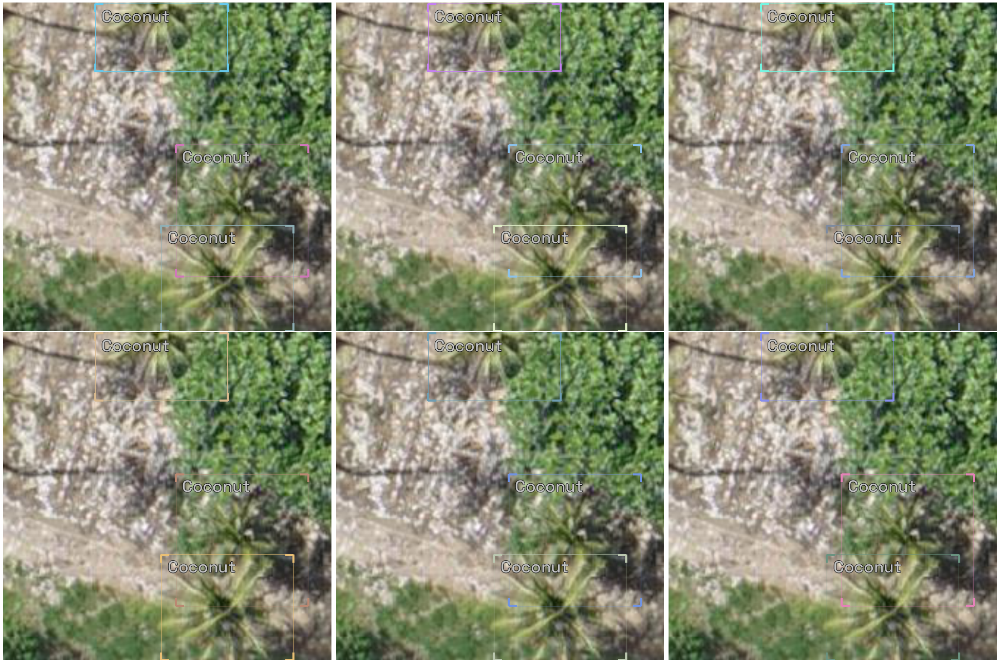

In [12]:
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[0] for _ in range(6)]
show_samples(samples, ncols=3)

1,2,5,6,7,11-15

In [13]:
# Just change the value of selection to try another model

selection = 1

extra_args = {}

if selection == 0:
  model_type = models.mmdet.vfnet
  backbone = model_type.backbones.resnet50_fpn_mstrain_2x

if selection == 1:
  model_type = models.mmdet.retinanet
  backbone = model_type.backbones.resnet50_fpn_1x
  # extra_args['cfg_options'] = { 
  #   'model.bbox_head.loss_bbox.loss_weight': 2,
  #   'model.bbox_head.loss_cls.loss_weight': 0.8,
  #    }

if selection == 2:
  model_type = models.mmdet.faster_rcnn
  backbone = model_type.backbones.resnet101_fpn_2x
  # extra_args['cfg_options'] = { 
  #   'model.roi_head.bbox_head.loss_bbox.loss_weight': 2,
  #   'model.roi_head.bbox_head.loss_cls.loss_weight': 0.8,
  #    }

if selection == 3:
  model_type = models.mmdet.ssd
  backbone = model_type.backbones.ssd300

if selection == 4:
  model_type = models.mmdet.yolox
  backbone = model_type.backbones.yolox_s_8x8

if selection == 5:
  model_type = models.mmdet.yolof
  backbone = model_type.backbones.yolof_r50_c5_8x8_1x_coco

if selection == 6:
  model_type = models.mmdet.detr #This can e tried as it works on small object
  backbone = model_type.backbones.r50_8x2_150e_coco

if selection == 7:
  model_type = models.mmdet.deformable_detr
  backbone = model_type.backbones.twostage_refine_r50_16x2_50e_coco

if selection == 8:
  model_type = models.mmdet.fsaf
  backbone = model_type.backbones.x101_64x4d_fpn_1x_coco

if selection == 9:
  model_type = models.mmdet.sabl
  backbone = model_type.backbones.r101_fpn_gn_2x_ms_640_800_coco

if selection == 10:
  model_type = models.mmdet.centripetalnet
  backbone = model_type.backbones.hourglass104_mstest_16x6_210e_coco

elif selection == 11:
  # The Retinanet model is also implemented in the torchvision library
  model_type = models.torchvision.retinanet
  backbone = model_type.backbones.resnet50_fpn

elif selection == 12:
  model_type = models.ross.efficientdet
  backbone = model_type.backbones.tf_lite0
  # The efficientdet model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 13: #Mobile Deployment
  model_type = models.ultralytics.yolov5
  backbone = model_type.backbones.small
  # The yolov5 model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 14: #Best as of now
  model_type = models.mmdet.vfnet
  backbone = model_type.backbones.swin_t_p4_w7_fpn_1x_coco

elif selection == 15: #2nd Best
  model_type = models.mmdet.vfnet
  backbone = model_type.backbones.resnet50_fpn_mstrain_2x  

model_type, backbone, extra_args

(<module 'icevision.models.mmdet.models.retinanet' from '/usr/local/lib/python3.8/dist-packages/icevision/models/mmdet/models/retinanet/__init__.py'>,
 {})

In [14]:
# Instantiate the model
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map), **extra_args)

  0%|          | 0/152149505 [00:00<?, ?B/s]

2023-02-13 17:20:18,408 - mmcv - INFO - initialize ResNet with init_cfg {'type': 'Pretrained', 'checkpoint': 'torchvision://resnet50'}
2023-02-13 17:20:18,410 - mmcv - INFO - load model from: torchvision://resnet50
2023-02-13 17:20:18,411 - mmcv - INFO - load checkpoint from torchvision path: torchvision://resnet50
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

2023-02-13 17:20:19,616 - mmcv - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2023-02-13 17:20:19,631 - mmcv - INFO - initialize FPN with init_cfg {'type': 'Xavier', 'layer': 'Conv2d', 'distribution': 'uniform'}
2023-02-13 17:20:19,687 - mmcv - INFO - initialize RetinaHead with init_cfg {'type': 'Normal', 'layer': 'Conv2d', 'std': 0.01, 'override': {'type': 'Normal', 'name': 'retina_cls', 'std': 0.01, 'bias_prob': 0.01}}
2023-02-13 17:20:19,725 - mmcv - INFO - 
backbone.conv1.weight - torch.Size([64, 3, 7, 7]): 
PretrainedInit: load from torchvision://resnet50 
 
2023-02-13 17:20:19,726 - mmcv - INFO - 
backbone.bn1.weight - torch.Size([64]): 
PretrainedInit: load from torchvision://resnet50 
 
2023-02-13 17:20:19,727 - mmcv - INFO - 
backbone.bn1.bias - torch.Size([64]): 
PretrainedInit: load from torchvision://resnet50 
 
2023-02-13 17:20:19,728 - mmcv - INFO - 
backbone.layer1.0.conv1.weight - torch.Size([64

load checkpoint from local path: checkpoints/retinanet/retinanet_r50_fpn_1x_coco_20200130-c2398f9e.pth
The model and loaded state dict do not match exactly

size mismatch for bbox_head.retina_cls.weight: copying a param with shape torch.Size([720, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([9, 256, 3, 3]).
size mismatch for bbox_head.retina_cls.bias: copying a param with shape torch.Size([720]) from checkpoint, the shape in current model is torch.Size([9]).


In [15]:
# Data Loaders
train_dl = model_type.train_dl(train_ds, batch_size=4, num_workers=8, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=4, num_workers=8, shuffle=False)

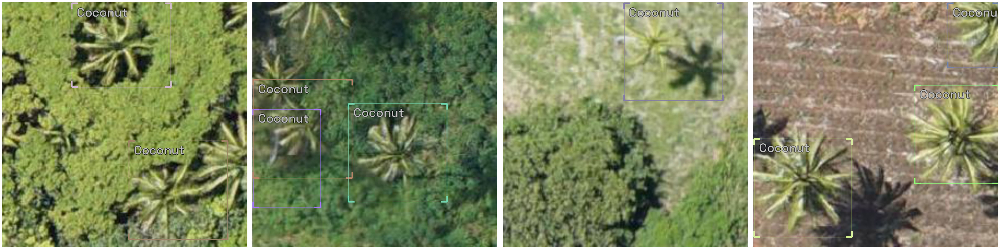

In [16]:
# show batch
model_type.show_batch(first(valid_dl), ncols=4)

In [17]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox, print_summary=True)]

In [18]:
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics, cbs=[SaveModelCallback(fname='/content/cheque_yolov5_medium')])

In [20]:
learn.save('test')

Path('models/test.pth')

In [21]:
import time
begin = time.time()

learn.fine_tune(150, 1e-3, freeze_epochs=15)
end = time.time()

epoch,train_loss,valid_loss,COCOMetric,time
0,0.638361,0.581935,0.358606,00:22
1,0.481943,0.467738,0.424717,00:14
2,0.424537,0.429302,0.448502,00:14
3,0.407340,0.446092,0.440672,00:14
4,0.413734,0.634552,0.411711,00:14
5,0.387961,0.415502,0.452923,00:14
6,0.359467,0.416149,0.455419,00:13
7,0.326864,0.417546,0.457192,00:14
8,0.360327,0.460095,0.468281,00:14
9,0.348269,0.434983,0.463316,00:14


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.359
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.653
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.348
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.359
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.229
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.550
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.629
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.629
Better model found at epoch 0 with v

epoch,train_loss,valid_loss,COCOMetric,time
0,0.313074,0.366193,0.504290,00:17
1,0.247572,0.389562,0.486133,00:15
2,0.201292,0.424520,0.483661,00:15
3,0.157314,0.510663,0.493880,00:15
4,0.115303,0.563297,0.490979,00:15
5,0.100791,0.659074,0.490212,00:15
6,0.089468,0.640693,0.473554,00:15
7,0.087041,0.700410,0.483807,00:15
8,0.081948,0.622853,0.493404,00:15
9,0.072992,0.777764,0.504304,00:15


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.504
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.839
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.515
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.504
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.270
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.684
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.705
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.705
Better model found at epoch 0 with v

epoch,train_loss,valid_loss,COCOMetric,time
0,0.313074,0.366193,0.504290,00:17
1,0.247572,0.389562,0.486133,00:15
2,0.201292,0.424520,0.483661,00:15
3,0.157314,0.510663,0.493880,00:15
4,0.115303,0.563297,0.490979,00:15
5,0.100791,0.659074,0.490212,00:15
6,0.089468,0.640693,0.473554,00:15
7,0.087041,0.700410,0.483807,00:15
8,0.081948,0.622853,0.493404,00:15
9,0.072992,0.777764,0.504304,00:15


 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.467
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.758
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.524
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.467
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.277
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.603
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.603
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.603
 Average Precision  (AP) @[ IoU=0.50

In [22]:
print(f"Total runtime of the program is {end - begin}")

Total runtime of the program is 2567.3670365810394


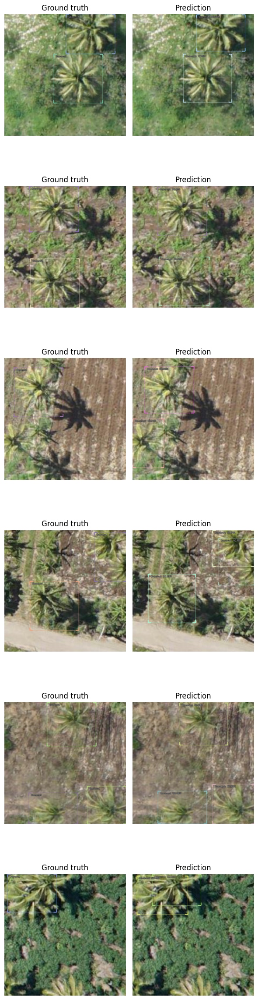

In [23]:
model_type.show_results(model, valid_ds, detection_threshold=.4)

In [ ]:
!unzip -q "/content/test_VOC.zip"

unzip:  cannot find or open /content/test_VOC.zip, /content/test_VOC.zip.zip or /content/test_VOC.zip.ZIP.


In [ ]:
!rm -r "/content/__MACOSX"

rm: cannot remove '/content/__MACOSX': No such file or directory


In [ ]:
os.listdir('/content/test_VOC')

['000382_jpg.rf.22c971940a302e354e86587e8ad3b5cb.xml',
 '000416_jpg.rf.27d8582d8558c5af2a276be6ad177a48.jpg',
 '000140_jpg.rf.a75461b5ba9d3345f094f5fb038decca.jpg',
 '000041_jpg.rf.0f07c2bdf01c3a660f936ca4af83c3fa.xml',
 '000384_jpg.rf.19c8f4391e6690c04b88d43d43660983.jpg',
 '000025_jpg.rf.e3908c114be5abdd0e514cbdc8cd0f30.jpg',
 '000149_jpg.rf.109cfda7c9175678cac05429dcfd1c2e.xml',
 '000014_jpg.rf.0dfa74c14f049652e0c95ca93bccb4c7.jpg',
 '000134_jpg.rf.afbeeaaf7e43d6aa16cb7b21a7ce69eb.xml',
 '000045_jpg.rf.cc328676db4873ed6b0287608f4f8912.xml',
 '000350_jpg.rf.a36f63dd42e6733e5f2fda0511dfff16.xml',
 '000461_jpg.rf.1549b365bfd6190472f38a677bdc5aa5.xml',
 '000380_jpg.rf.8f407418d2e5ab3de539735119ef2525.jpg',
 '000367_jpg.rf.cab136956cb7b20bf26d87305d488975.xml',
 '000458_jpg.rf.a788fa9ec7119eec6de88dac136e078f.jpg',
 '000438_jpg.rf.b2c93bb40149e8a6f8a852ea92649676.jpg',
 '000116_jpg.rf.8bcf4208de4552c2566068b59e85b2d6.xml',
 '000010_jpg.rf.948c33366e83388cdfce8ce42a776cea.xml',
 '000209_j

In [25]:
data_dir = "/content/COCONUT"
spliter =RandomSplitter([0, 0, 1.0], seed=42)
parser = parsers.VOCBBoxParser(annotations_dir=data_dir, images_dir=data_dir)
_,_,test_records = parser.parse(spliter)
image_size = 640

test_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])
test_ds = Dataset(test_records, test_tfms)

  0%|          | 0/379 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/379 [00:00<?, ?it/s]

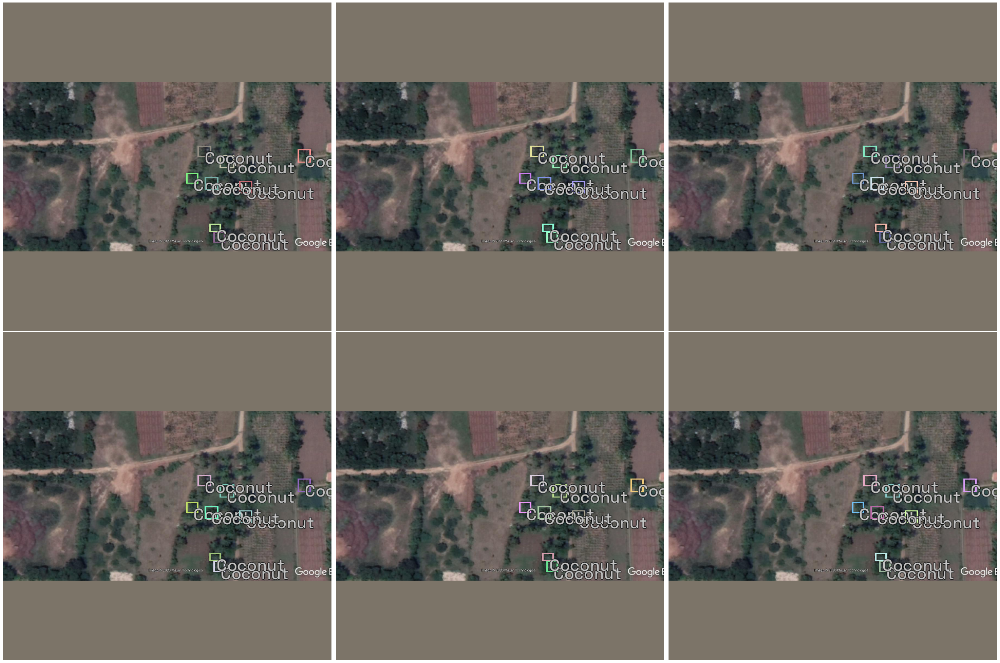

In [26]:
# Show an element of the train_ds with augmentation transformations applied
samples = [test_ds[0] for _ in range(6)]
show_samples(samples, ncols=3)

In [27]:
test_dl = model_type.valid_dl(test_ds, batch_size=4, num_workers=8, shuffle=False)

# Test Accuracy

In [28]:
learn.validate(dl=test_dl) 

 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.001
Better model found at epoch 0 with valid

(#2) [2.4987902641296387,1.841578905204488e-05]

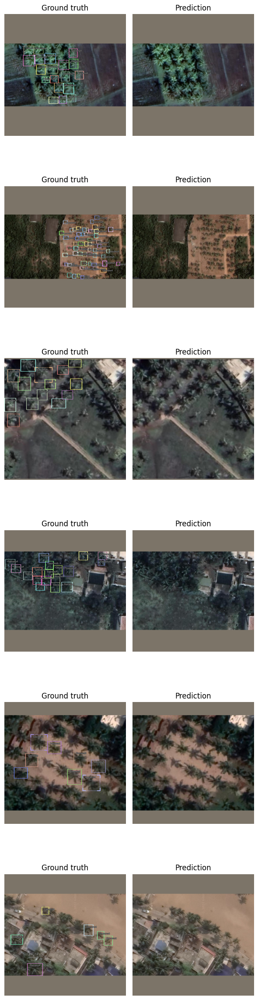

In [29]:
model_type.show_results(model, test_ds, detection_threshold=.4)

# Train Accuracy

In [30]:
learn.validate()

 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.504
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.839
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.515
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.504
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.270
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.684
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.705
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.705
Better model found at epoch 0 with v

(#2) [0.3661928176879883,0.5042901090843255]

# Change model No in model_no.zip

In [31]:
import os

path = "/content/drive/MyDrive/Model_1"
os.mkdir(path)

In [32]:
# change path

In [33]:
!cp /content/models/test.pth /content/drive/MyDrive/Model_1

# Saving Metadata

In [34]:
from icevision.all import *
import warnings
warnings.filterwarnings('ignore')
from fastai.callback.tracker import SaveModelCallback
import glob, os, shutil

In [35]:
from icevision.models import *

model_type = models.mmdet.retinanet
  backbone = model_type.backbones.resnet50_fpn_1x

In [36]:
# How to save a model and its metadata
checkpoint_path = '/content/full_model1.pth'
save_icevision_checkpoint(model, 
                        model_name='mmdet.retinanet', 
                        backbone_name='resnet50_fpn_1x',
                        classes =  parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

In [37]:
!cp /content/full_model1.pth /content/drive/MyDrive/Model_1